# Introduction to PID Controllers

A [PID Controller](https://en.wikipedia.org/wiki/Proportional%E2%80%93integral%E2%80%93derivative_controller) is a type of feedback control system that allows us to achieve a desired outcome whilst taking into account errors and limitations of physical devices.

When trying to control, for example, the speed of a motor, we use a power source and a motor driver connected to the motor and we can adjust the motor output but varying the current we supply to the motor driver. However due to manufacturing inconsistencies and other physical factors, it will be difficult for the motor to consistently spin at a desired RPM. This is where PID Controllers come into play.

PID works on the error in the system. The error is the difference between the desired outcome and the actual outcome.

<center>
    $u(t) = K_p\,e(t) + K_i\,\int\limits_0^t e(\tau) d\tau + K_d \frac{\delta e(t)}{\delta t}$
</center>

PID is an acronym for:
- **P** - Proportional,
- **I** - Integral,
- **D** - Derivative.

<center>
<img src="https://i0.wp.com/microcontrollerslab.com/wp-content/uploads/2019/02/2-PID-controller-Arduino.png?ssl=1" width="900" height="700" alt="PID Controller Diagram" />
</center>

### Proportional (Present)

The **Proportional Control** is responsible for the response time of the system. It controls how fast our system will try to reduce the error.
<center>
<img src="https://www.clippard.com/cms/sites/default/files/wiki_images/typical-pi-behaviors.png" width="600" height="600" alt="PID Controller Diagram" />
</center>

### Integral (Past)

The **Integral Control** keeps track of past errors in order to reduce the overshoot as show in the graphs above. When the error is too small that the **Proportional** controller cannot effect the system, then the **Integral** controller helps to stabilize the system.

### Derivative (Future)

The **Derivative Control** checks how fast the error is changing and adjusts the system. Its a mechanism to dampen the oscillations of the system. 

<center>
<img src="https://www.researchgate.net/publication/360323251/figure/fig10/AS:1155429602201611@1652487292245/Principle-of-Derivative-Controller.ppm" width="500" height="500" alt="PID Controller Diagram" />
</center>

## Anti-Windup

Physical devices such as motors or sensors are non-linear. They have a maximum output or reading they can give. When such a device reaches this limit, we call the scenario **saturation**.

In some cases, our PID controller might cause the controlled device to saturate, i.e. the controller output is beyond the saturation level. This will cause issues when the system is about to reach the desired outcome. Since the device has saturated and the controller's output is very high, then the system will overshoot the desired outcome and take longer to come back to the desired outcome as the controller tries to **windup**.

<center>
<img src="https://www.researchgate.net/profile/Ayyarao_Tummala/publication/317490264/figure/fig1/AS:503583687626752@1497075115261/Speed-output-with-anti-windup-controller-regained-to-reference-speed-within-05-s-But.png" width="400" height="400" alt="PID Controller Diagram" />
</center>

In order to prevent this from happening, we implement **[anti-windup](https://www.bing.com/ck/a?!&&p=ad0951ad6aee0ab2JmltdHM9MTY5MzAwODAwMCZpZ3VpZD0yMDU3MDRhYi01NmVlLTY1NDAtMzVhZS0xNzk2NTc0NzY0NTgmaW5zaWQ9NTIxMA&ptn=3&hsh=3&fclid=205704ab-56ee-6540-35ae-179657476458&psq=antiwindup&u=a1aHR0cHM6Ly93d3cubWF0aHdvcmtzLmNvbS9oZWxwL3NpbXVsaW5rL3NscmVmL2FudGktd2luZHVwLWNvbnRyb2wtdXNpbmctYS1waWQtY29udHJvbGxlci5odG1s&ntb=1)** methods. A common example is the **Clamping method**

## Noise Filtering

Noise is any unwanted interferences in our signal. We normally encounter noise when dealing with sensor readings. The noise we get is very small (low power), however it becomes more apparent at high frequencies.

#### Examples of Noise

- White noise
- Thermal noise
- Shot noise
- Flicker noise
- Burst noise
- Coupled noise

In our PID controller, the **Derivative** will amplify this noise which will give us unwanted or misleading readings.

### Low Pass Filter

In order to remove high frequency noise, we use a [Low-pass filter](https://en.wikipedia.org/wiki/Low-pass_filter) to attenuate high frequency signals and only allow low frequency signals to pass.

A common low-pass filter has the following Laplace-domain Transfer function:
<center>
    $\frac{N}{S + N}$
</center>

Where,
**S** is the Laplace Domain Derivative<br>
**N** is the cut-off frequency

#### Implementation

In order to implement the filter to our PID controller, we can feed our data from the Derivative into the filter as shown below:

<center>
<div>
    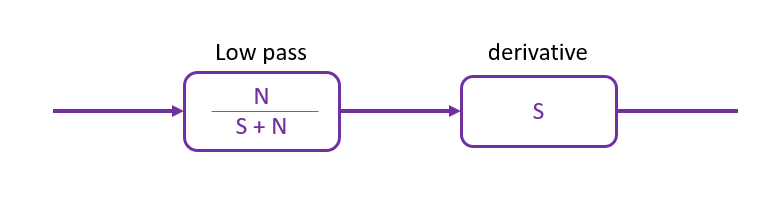
</div>
</center>

However, it is inefficient and involves a lot of calculations. A better alternative is to use an **Integral** in the feedback path, which is illustrated below:

<center>
<div>
    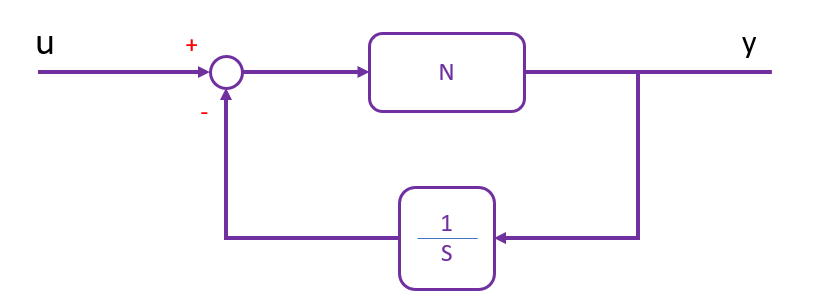
</div>
</center>

These 2 approaches have the same [block reduction](https://electronicscoach.com/block-diagram-reduction-rules.html):

<center>
    $\frac{SN}{S + N}$
</center>

## PID Tuning Basics

**PID Tuning** is the process of obtaining the Gains for the controller, i.e the **Proportional gain**, **Integral gain** and the **Derivative gain**.

We will utilize Matlab to make this process easier and more efficient.

### PID Control System Design Overview

<center>
<div>
    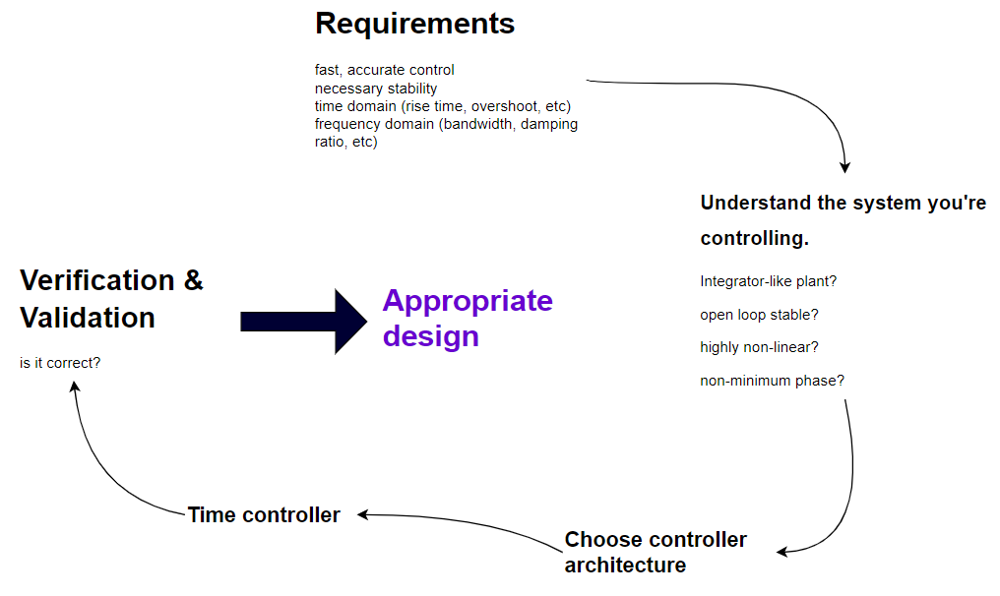
</div>
</center>


**We are going to focus on well-behaved systems for the remainder of this guide.**

These are systems that are:
- Stable,
- Nearly linear,
- Minimum phase and,
- Manageable amount of delay.

### PID Tuning Flow Chart

<center>
<div>
    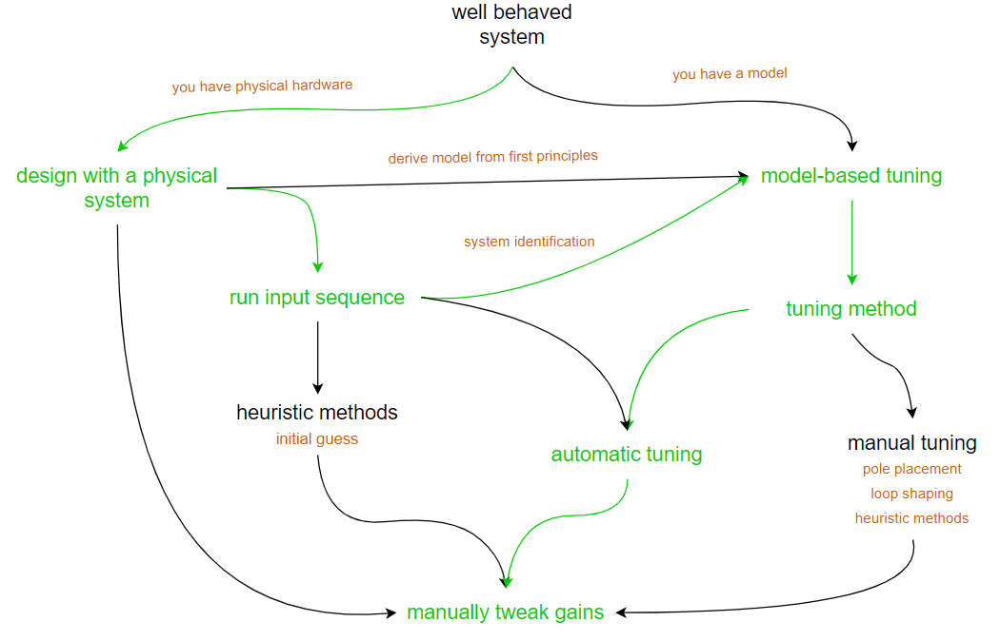
</div> 
</center>

### For Robocon, we will be using a simpler procedure to obtain the PID controller gains:

1. Design with physical system,
2. Run input sequence,
3. Model-based tuning (System Identification)
4. Automatic tuning
5. Manually tweak gains.

#### 1. Design with physical system

We can use our actual hardware, such as DC motors, to obtain and test our PID controller gains.

#### 2. Run input sequence

An input sequence is a process whereby we provide an input to our system and observe and record the output. For example, incrementing the current supplied to a DC motor and recording the resulting motor RPM. This data can then be used in the next step.

#### 3. Model-based tuning (System Identification)

In MATLAB, we can use [System Identification](https://www.mathworks.com/help/ident/gs/about-system-identification.html) to derive the Model of our system without prior or extensive knowledge of control systems.

> A **Model** is a set of equations that represent the system.

#### 4. Automatic tuning

This process will be handled by Matlab. It will use heuristic methods to approximate the ideal controller gains for our system.

> ##### What are Heuristic Methods?
> 
> The heuristic approach to tuning a PID controller is a method of adjusting the proportional, integral, and derivative gains based on general rules and approximations. One example of heuristic tuning is the **Ziegler-Nichols method**, which involves setting the I and D gains to zero and finding the P gain that causes stable oscillations. Another example is the **trial-and-error method**, which involves manually changing the gains until a satisfactory performance is achieved. Some heuristic tuning methods use meta-heuristic algorithms such as GA, PSO, and SA to optimize the PID parameters.
>
> Source: Conversation with Bing<br>
> (1) [PID Tuning Methods. What is PID Tuning? | by Snayush | Medium.](https://medium.com/@snayush77/pid-tuning-methods-8b3d39e5263c).<br>
> (2) [Heuristic Strategy of PID Tuning](https://bing.com/search?q=heuristic+strategy+of+PID+tuning).<br>
> (3) [Heuristic PID Tuning Procedures | Process Dynamics and PID Controller](https://control.com/textbook/process-dynamics-and-pid-controller-tuning/heuristic-pid-tuning-procedures/).<br>
> (4) [PID tuning methods - INCATools.](https://www.incatools.com/pid-tuning/pid-tuning-methods/).<br>
> (5) [Heuristic PID Tuning Method - Inst Tools.](https://instrumentationtools.com/heuristic-pid-tuning-method/).<br>
> (6) [Springer.com](https://link.springer.com/article/10.1007/s40435-020-00665-4).<br>

#### 5. Manually tweak gains

After the Automatic Tuning, we then manually adjust the gains to achieve our desired system response.

## Generating a Model

We are going to use a DC motor as an example to demonstrate how to obtain the Plant Model in Matlab. The objective is to derive the model of a DC motor and sensor plant with a voltage input and a motor speed output.

There are multiple ways to achieve this:
1. Generating a model from first principles,
2. System Identification,
3. Linearization

### 1. Generating a model from first principles

This requires writing out the equations that govern the system. You can follow the steps [here](https://www.youtube.com/redirect?event=video_description&redir_token=QUFFLUhqa3otWkwwY3Q0S3hpS1ZFcFJjcHVoNEs3clRLUXxBQ3Jtc0ttVmJCSnBZVFcyN0FhbXhrU1MwaHhtWXZ6WXN6ZFhNZnNNM0lhanJpam56SnUwdk5OVkFqLUF2U3dYbHUwdkZsblYzdlJ2SFJaYnN4dTgweWY0YzNCTkhocVBzeVV0dE9KMDB6YTZqcktUb1ZBWnUyNA&q=http%3A%2F%2Fbit.ly%2F2KFp8va&v=qhIjIu-Zk10) to generate a DC motor model from first principles.

### 2. System Identification

It utilises the relation between the **input** and **output** of a system to derive the Model.

#### First, Run an Input sequence

**If you don't have access to physical hardware, you can use the generated model from (1) then, using Simulink, assign the Step Input and Motor Speed Output to variables.**

- To assign the Step Input's output to a variable, use the **To Workspace** block, same applies for the Motor Speed Output as shown below.

<center>
<div>
    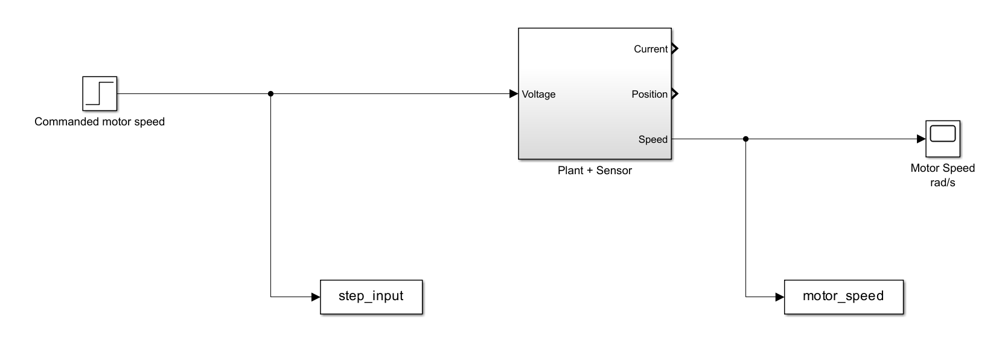
</div> 
</center>

- For each of the variables above, the `step_input` and `motor_speed`, make sure the **Save format** is set to **Array** as shown below:

<center>
<div>
    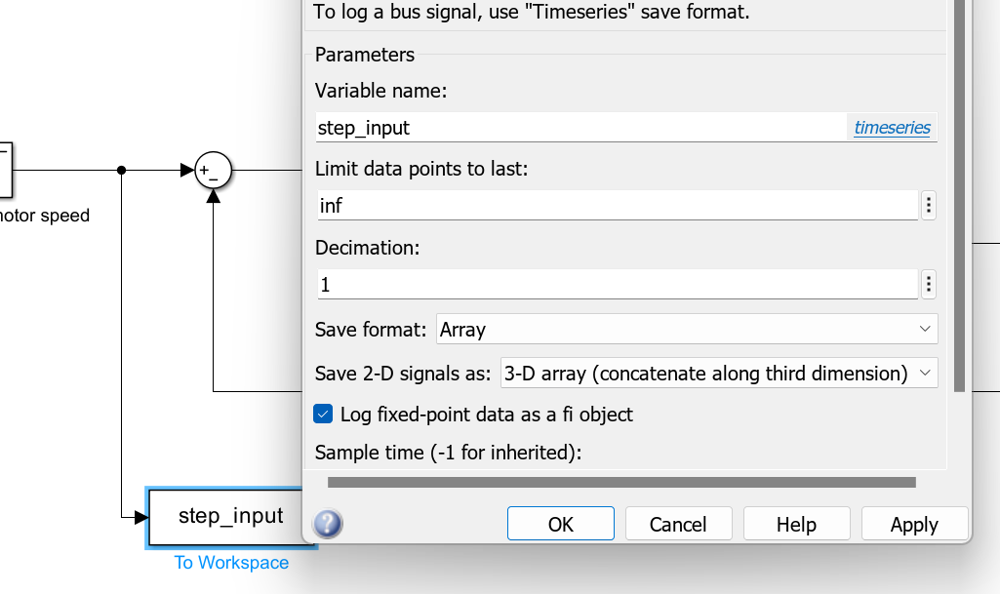
</div> 
</center>

- **NB:** To be able to easily access the Simulation Output variables, go to **Model Settings** > **Data Import/Export** > Uncheck "Single simulation output" as show below:

<center>
<div>
    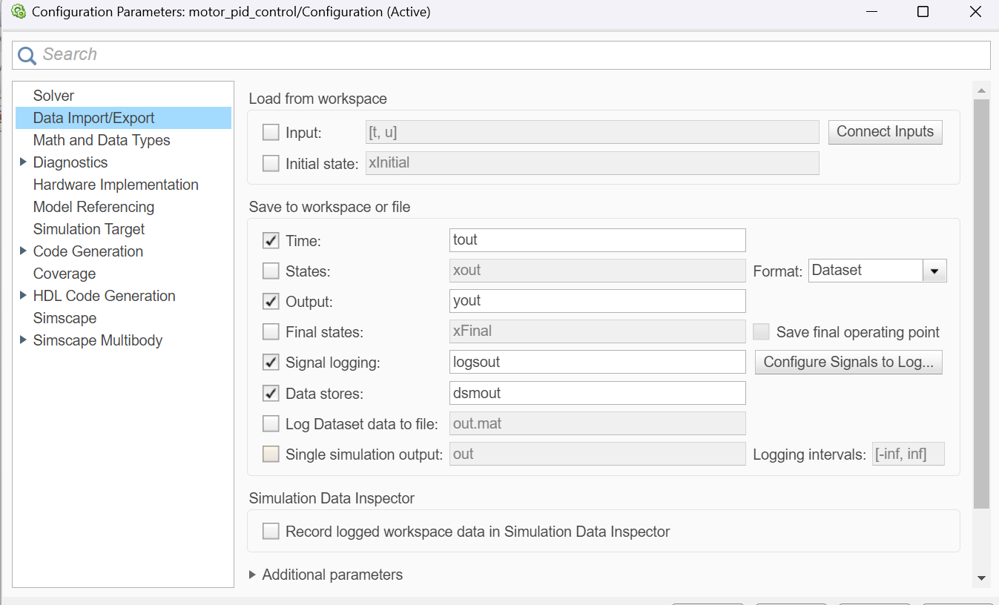
</div> 
</center>

- Then **Run** the simulation. The `step_input` and `motor_speed` will appear as variables in your Matlab workspace.

##### Using Arduino

Our circuit will include:
- Arduino Mega,
- Brushed DC Motor,
- Motor Driver,
- Motor Encoder.

##### Connection

<center>
<div>
    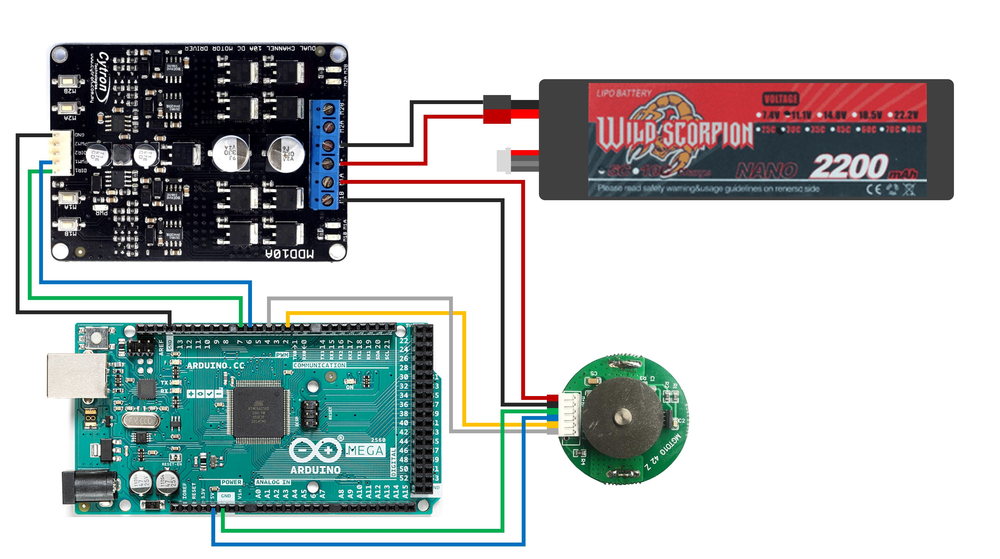
</div> 
</center>

| Arduino Mega | DC Motor | Motor Driver | Motor Encoder |
| :-: | :-: | :-: | :-: |
| Pin 7 | - | DIR | - |
| Pin 6 | - | PWM | - |
| Gnd | - | Gnd | - |
| - | Vin | M+ | - |
| - | Gnd | M- | - |
| Pin 2 | - | - | A |
| Pin 4 | - | - | B |
| 5V | - | - | E+ (Vin) |
| Gnd | - | - | E- (Gnd) |

***Connect the motor driver to a 12V power supply.***

##### Arduino Code

We will create a program that performs the following tasks:
- Provide an incrementing voltage input to motor driver,
- Count the number of encoder pulses as the motor spins,
- Calculate the motor speed,
- Calculate the motor RPM,
- Output the Motor PWM and Motor RPM to the Serial Monitor.

Our code starts with importing the `atomic library` from `util`. This library will give us access to the `ATOMIC_BLOCK` that allows us to safely access volatile variables that are modified by Interrupt functions. 

In [ ]:
#include <util/atomic.h>

We then define all our pins based on the Connections above:

In [ ]:
// pins
#define EncOutA 2
#define EncOutB 4

#define MotorDirPin 7
#define MotorPWMPin 6

Next, we define variables for:
- Motor RPM Calculation,
- Encoder Pulses Per Revolution value,
- Interrupt Position,
- Motor PWM value,
- Motor PWM Increment

In [ ]:
// variables for motor RPM calculation
long prevTime = 0;
int prevPos = 0;

const float PPR = 400; //The value is the Pulses Per Rotation of the Motor Encoder which can be obtained from it's datasheet.

volatile int interruptPos = 0; // variable to keep track of the encoder counts

double motorPWM = 0; // start motor at 0 PWM
const int motorPWMIncrement = 10;

We use the `volatile` keyword to allow us to modify that variable during within the Interrupt function. You can read more on Interrupts in Arduino.

Now, we need to write our Setup code that initiliazes the Serial Communication, sets the pin modes and attaches our Interrupt:

In [ ]:
void setup() {
  // initiliaze Serial
  Serial.begin(115200);

  // Encoder pins
  pinMode(EncOutA, INPUT_PULLUP);
  pinMode(EncOutB, INPUT_PULLUP);

  // Motor pins
  pinMode(MotorDirPin, INPUT);
  pinMode(MotorPWMPin, INPUT);

  // Interrupt pins
  attachInterrupt(digitalPinToInterrupt(EncOutA), readEncoder, RISING);

  delay(2000); // to allow us to switch on the motor
}

We add a `delay` of 2 seconds to give us some time to power on the motor but this line is optional.

The `attachInterrupt` function sets up an Interrupt on Pin **EncOutA** and triggers when the process **RISING** occurs. **RISING** occurs when the input changes from LOW to HIGH.

We need to define the `readEncoder` function that will be called when the Interrupt is triggered. This function checks whether the `EncOutB` is HIGH or LOW which determines the direction of rotation. It then increments the `InterruptPos` variables respectively.

In [ ]:
// Encoder ISR
void readEncoder() {
  int b = digitalRead(EncOutB);

  if (b > 0) {
    interruptPos--;
  } else {
    interruptPos++;
  }
}

Next, in our `loop` function we need to access the Encoder counts using the `ATOMIC_BLOCK`. 

In [ ]:
int pos = 0; // local variable for motor angular position

  // atomic block allows us to safely access the volatile variable
  ATOMIC_BLOCK(ATOMIC_RESTORESTATE) {
    pos = interruptPos;
  }

Next we set the analog output voltage of our `MotorPWMPin` to the `MotorPWM` value:

In [ ]:
analogWrite(MotorPWMPin, motorPWM); // Output the PWM to the motor driver

Next, we calculate the motor velocity/speed.

To calculate velocity, we first find the time elapsed between encoder counts. `(float)(currTime - prevTime)` converts the time difference to a `float`. Dividing the difference by $1\times 10^6$ gives us the difference in seconds.

The motor velocity is then the number of encoder counts read during the time difference.

In [ ]:
// calculate time difference
  long currTime = micros();
  float deltaTime = ((float)(currTime - prevTime)) / 1.0e6;

  // calculate motor velocity
  float v = (pos - prevPos) / deltaTime;

We then update the `prevPos` and `prevTime` variables so that the next iteration will use the latest readings.

In [ ]:
  // update calculation variables
  prevPos = pos;
  prevTime = currTime;

To calculate Motor RPM, which is Revolutions Per Minute, we divide the motor velocity by the Pulses Per Rotations (PPR) and then multiply by 60 to convert to RPM.

<center>
$RPM = speed\times \frac{pulses}{s} \times \frac{1}{PPR}$<br><br>
$= speed\times \frac{pulses}{s} \times \frac{R}{pulses}$<br><br>
$= speed\times \frac{R}{s}$<br><br>
$= speed\times \frac{R}{s} \times \frac{60s}{1min}$<br><br>
$\therefore RPM = speed\times \frac{R}{min}$
</center>

In [ ]:
// calculate motor RPM
  float motorRPM = v / PPR * 60.0;  // multiply by 60 to convert to RPM

To display the Output, we can directly print out the motor PWM and motor RPM.

We also increment the motor PWM and reset the `lastRPMRecording` variable.

In [ ]:
  // Output Values to Serial
  Serial.print(motorPWM);
  Serial.print(", ");
  Serial.println(motorRPM);

  // increment motor PWM
  motorPWM += motorPWMIncrement;

  // reset timer
  lastRPMRecording = millis();

For our **PID control** we will need to obtain the motor RPM readings at a sampling frequency and also the motor will need some time to accelerate. We will use a Conditional Statement to check if the time elapsed is greater than our chosen **sampling time** and then calculate and display the RPM.

To do this, we need to define additional variables at the top that are:
- `lastRPMRecording`: To store the time when we last printed out the RPM,
- `SamplingTime`: Our threshold for the time in-between print outs.

In [ ]:
// variable to track when the last RPM recording was performed
long lastRPMRecording = 0;
const long SamplingTime = 1000; // space out recording by a second

For the conditional, we simply check if the current time `millis()` minus the `lastRPMRecording` time are greater than the **sampling time**. If true, then:
- Proceed with calculations and outputs.

Else, we will `return` from the `loop` function such that adjacent lines of code won't be executed.

Add the following line to the top of the `loop` function.

In [ ]:
 // check if recording delay time has elapsed.
  if((millis() - lastRPMRecording) < SamplingTime) return;

Our code should work however, you will notice that the motor will keep increasing speed up to infinity, which will be bad for the micro-controller as well as the motor itself.

To solve this issue, we will add another conditional statement at the top of the `loop` function to prevent further calculations and outputs.

But we need another variable `MotorPWMLimit` to specify the PWM at which our program will stop running. We define it at the top.

In [ ]:
const double MotorPWMLimit = 250; // Motor PWM limit

A limit of **250** should be sufficient enough to obtain the model.

Next, we add our conditional statement:

In [ ]:
// check if PWM limit has been reached
  if(motorPWM >= MotorPWMLimit){
    analogWrite(MotorPWMPin, 0); // stop motor

    return; // stop execution of code below
  }

**The complete code:**

In [ ]:
#include <util/atomic.h>

// pins
#define EncOutA 2
#define EncOutB 4

#define MotorDirPin 7
#define MotorPWMPin 6

// variables for motor RPM calculation
long prevTime = 0;
int prevPos = 0;

const float PPR = 400; //The value is the Pulses Per Rotation of the Motor Encoder which can be obtained from it's datasheet.

volatile int interruptPos = 0; // variable to keep track of the encoder counts

// variable to track when the last RPM recording was performed
long lastRPMRecording = 0;
const long SamplingTime = 1000; // space out recording by half a second

double motorPWM = 0; // start motor at 0 PWM
const int motorPWMIncrement = 10;
const double MotorPWMLimit = 250; // Motor PWM limit

void setup() {
  // initiliaze Serial
  Serial.begin(115200);

  // Encoder pins
  pinMode(EncOutA, INPUT_PULLUP);
  pinMode(EncOutB, INPUT_PULLUP);

  // Motor pins
  pinMode(MotorDirPin, INPUT);
  pinMode(MotorPWMPin, INPUT);

  // Interrupt pins
  attachInterrupt(digitalPinToInterrupt(EncOutA), readEncoder, RISING);

  delay(2000); // to allow us to switch on the motor
}

void loop() {

  // check if PWM limit has been reached
  if(motorPWM >= MotorPWMLimit){
    analogWrite(MotorPWMPin, 0); // stop motor
    motorPWM = 0; // reset variable

    return; // stop execution of code below
  }
  
  // check if recording delay time has elapsed.
  if((millis() - lastRPMRecording) < SamplingTime) return;

  int pos = 0; // local variable for motor angular position

  // atomic block allows us to safely access the volatile variable
  ATOMIC_BLOCK(ATOMIC_RESTORESTATE) {
    pos = interruptPos;
  }

  analogWrite(MotorPWMPin, motorPWM); // Output the PWM to the motor driver

  // calculate time difference
  long currTime = micros();
  float deltaTime = ((float)(currTime - prevTime)) / 1.0e6;

  // calculate motor velocity
  float v = (pos - prevPos) / deltaTime;

  // update calculation variables
  prevPos = pos;
  prevTime = currTime;

  // calculate motor RPM
  float motorRPM = v / PPR * 60.0;  // multiply by 60 to convert to RPM

  // Output Values to Serial
  Serial.print(motorPWM);
  Serial.print(", ");
  Serial.println(motorRPM);

  // increment motor PWM
  motorPWM += motorPWMIncrement;

  // reset timer
  lastRPMRecording = millis();
}

// Encoder ISR
void readEncoder() {
  int b = digitalRead(EncOutB);

  if (b > 0) {
    interruptPos--;
  } else {
    interruptPos++;
  }
}

After obtaining the data in the Serial Monitor, copy it into an Excel Spreadsheet. Split the data into 2 separate columns using **Data > Text to Columns** and following the Wizard's steps.

<center>
<div>
    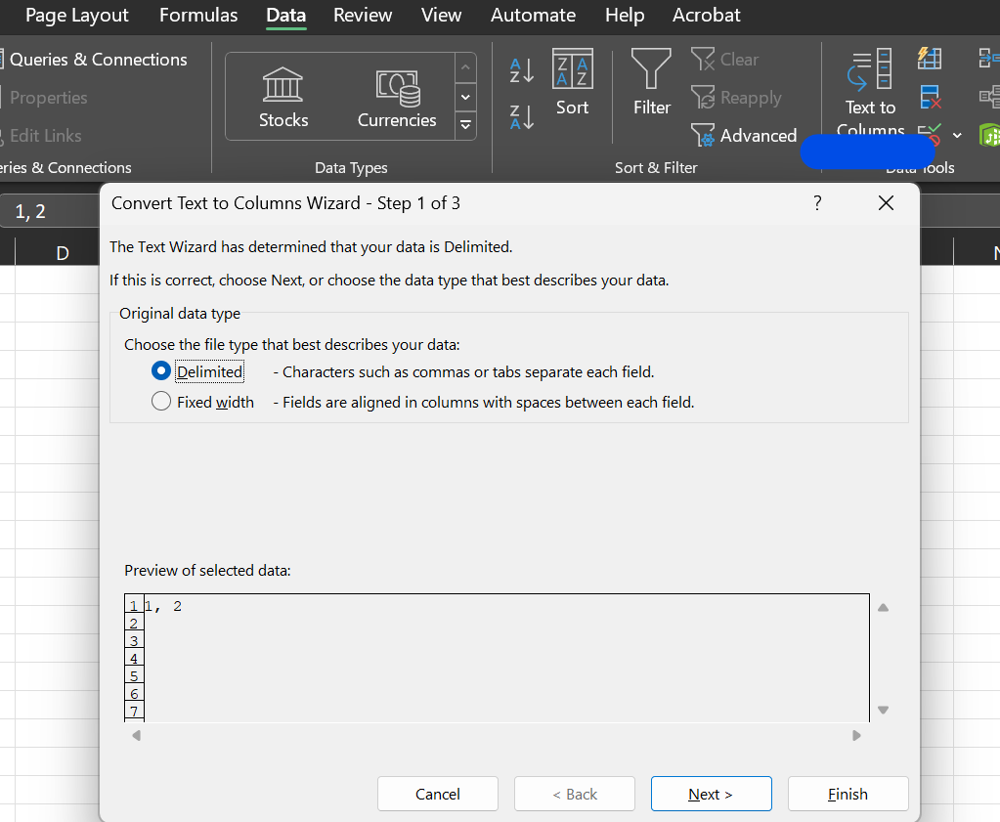
</div>
</center>

#### Second, system identification in Matlab

With your data split into 2 columns, copy each column into Matlab.
- Your column 1 (Motor PWM), create a variable named `step_input` and the paste the data,
- Column 2 (Motor RPM), create a variable named `motor_speed` and paste the data.

> ##### To create a variable in Matlab
> Go to **Home** > **Variable** > **New Variable**<br>
> Double click the title to edit the name as shown below:
> <center>
> <div>
> 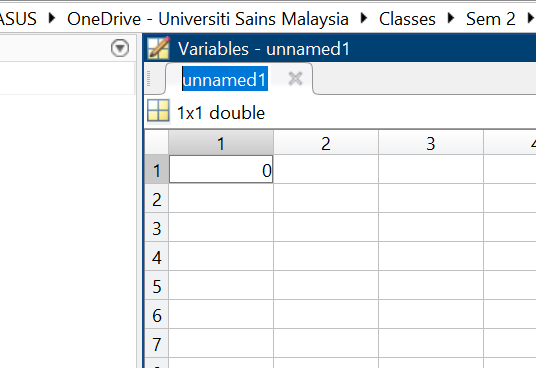
> </div>
> </center>
> Then paste the data into the respective rows and/or columns.

Next step, run the following commands in the command window to check your data plots (Optional):

```
plot(step_input)
plot(motor_speed)
```

Afterwards, open **System Identification** from the **Apps** tab.
- Click on the **Import Data** dropdown > **Time-Domain Signals**
- Then fill in the fields, on the window that pops up, as follows:

<center>
<div>
    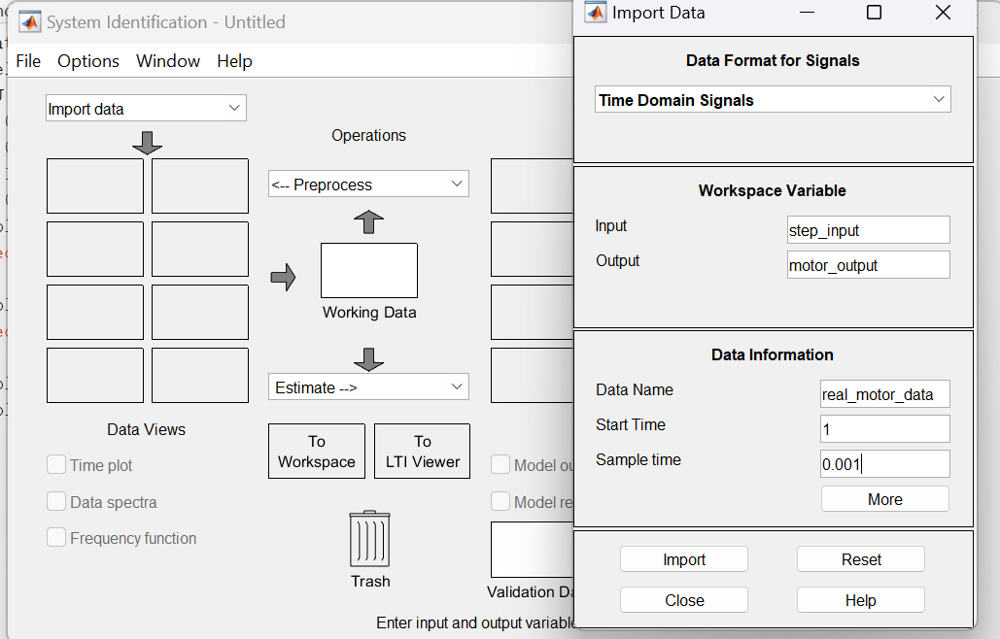
</div>
</center>

**NB:** The `Sample time` should be the same as the one for your `Step Input` and the time between measurements in your Arduino code (`SamplingTime`). In this case the **Sample time** is 0.001s.

- Click on **Import**,
- Select the **Estimate -->** dropdown > **Transfer Function Models**,
- Accept the defaults on the window that appears,
- Click **Estimate**

**NB:** Remember the name of the model.

<center>
<div>
    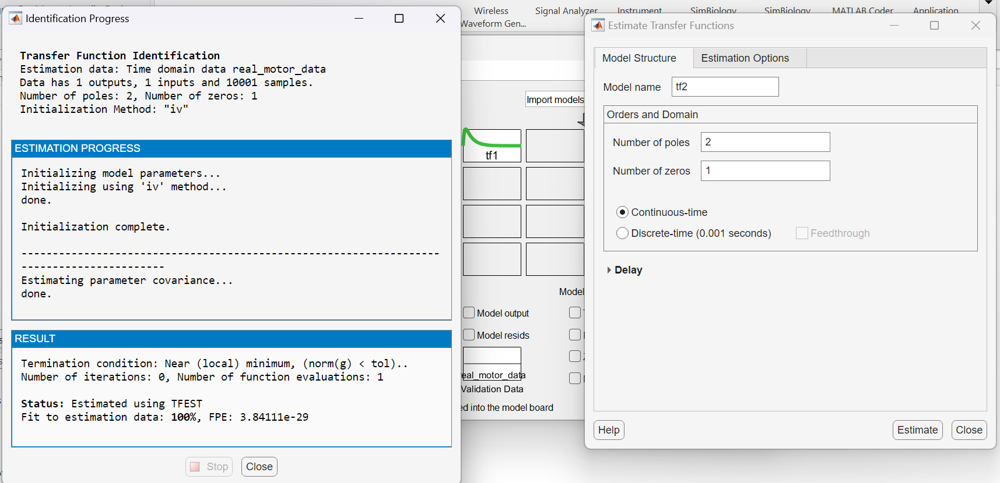
</div>
</center>

- Next, drag the your model from the **Model Views** pane, in my case `tf1`, to the **To Workspace box**. (You should see the model name appear in the **Workspace window**)

<center>
<div>
    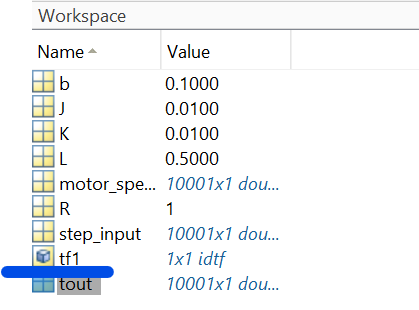
</div>
</center>

- Type in the model name in the command window to see its details:

<center>
<div>
    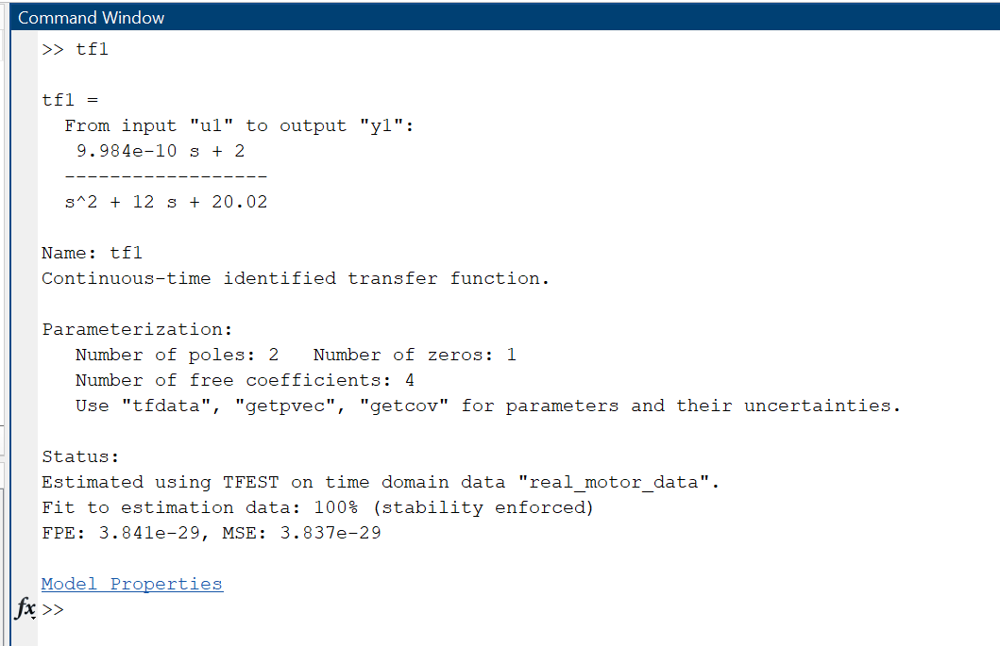
</div>
</center>

- Now, we can go back to Simulink and use this model as a **Transfer Function** to simulate our plant.
- In Simulink, add a **Step Input** block with a 0.001s sampling time as above.
- Add a **Scope** block.
- Add a **Transfer Function** block and assign the values we obtained from our System Identification as shown below (Separate the coefficients by a comma):

<center>
<div>
    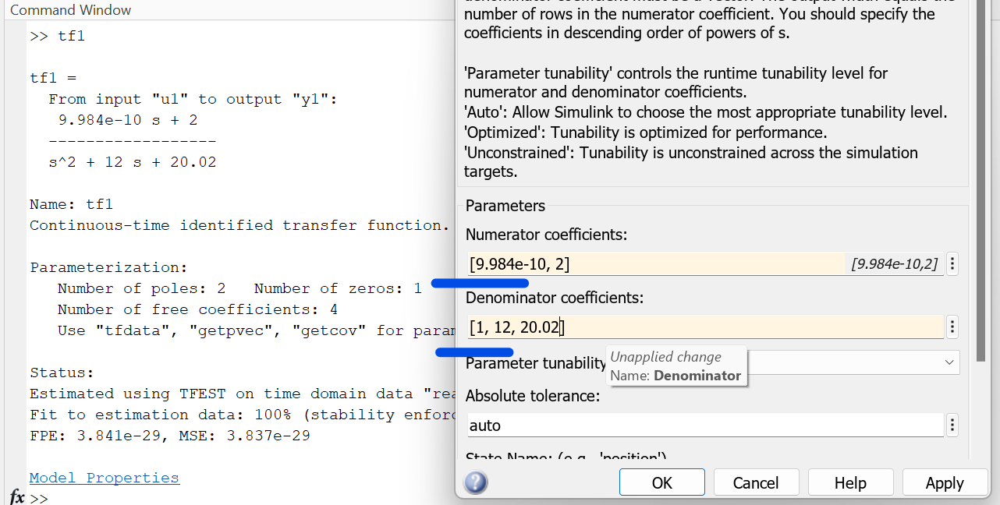
</div>
</center>

- I also added the Simscape Motor Model from earlier just for comparison. I used the Input and Output from the Simscape model to derive the Model using System Identification that's why my estimation is **100%**
- Run the simulations.
- Double-click the Scope block to view the Data Plot as shown below:

<center>
<div>
    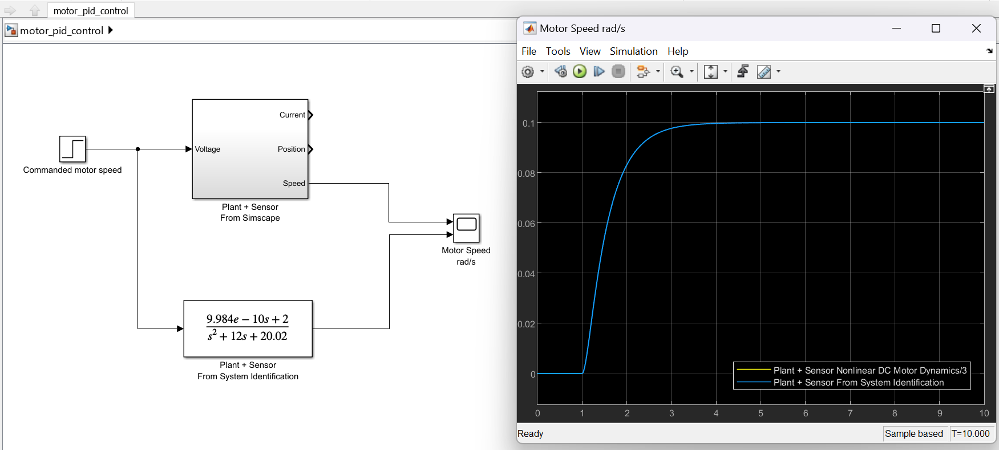
</div>
</center>

**Since the estimation is 100%, the lines overlap.**

### 3. Linearization Techniques

This is used to produce more reliable results from a non-linear physical system. It can be easier to troubleshoot.

However, this technique requires generating the model of the non-linear system using first principles. For more information about this technique and how to do it, [click here](https://www.youtube.com/watch?v=qhIjIu-Zk10&t=251s&ab_channel=MATLAB)

## Automatic Tuning

**We will be using the model we generated from System Identification.**

- Open Simulink with the model from earlier,
- Add a **Step Input** block,
- Add a **Sum** block with the parameter *List of signs* set to *+-*,
- Add a **PID Controller** block, 
- Add a **Scope** block.

Your Simulink Model should look like this:

<center>
<div>
    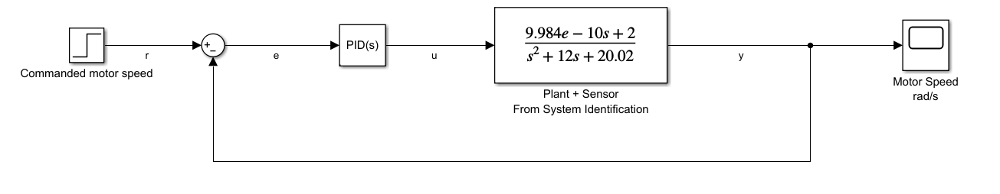
</div>
</center>

- Double-click on the **PID Controller** block,

**NB:** You can set some **Saturation** limits and enable anti-windup to improve the performance of your PID controller.

Here, I have sent an upper saturation limit of *24V* and selected *clamping* as the anti-windup method.

<center>
<div>
    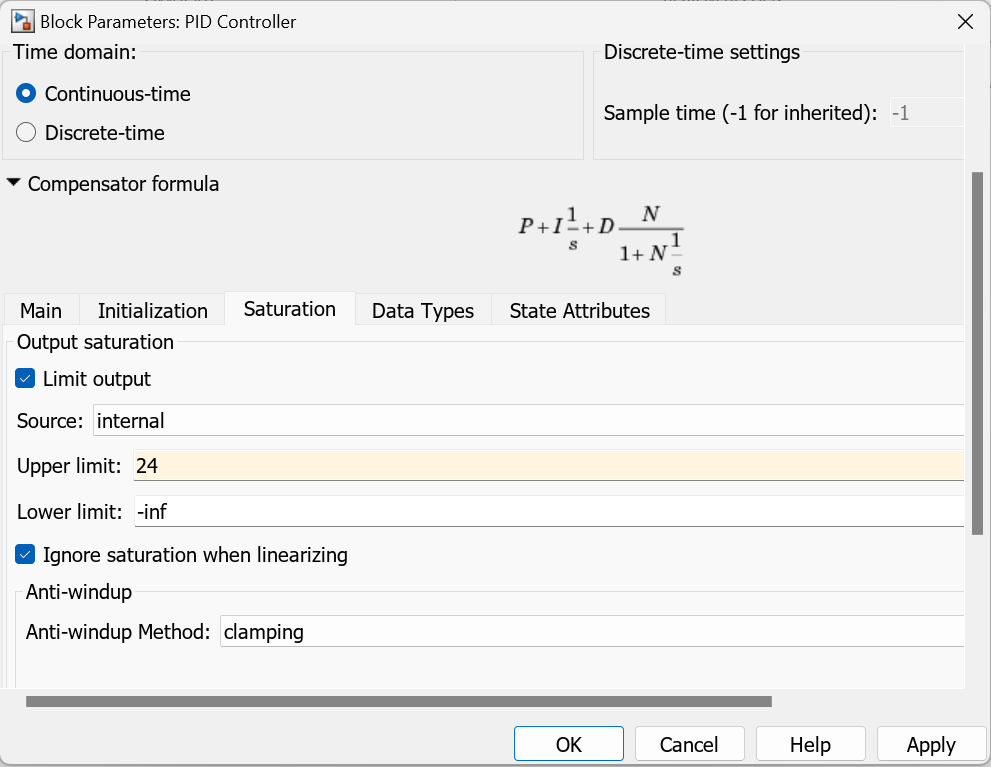
</div>
</center>

- Click on **Tune** under **Automated Tuning** on the **Main** tab.

Now, Matlab will try to estimate the PID gains based on a Transfer Function approach.

A new window will appear showing the **Tuned** response as shown below:

<center>
<div>
    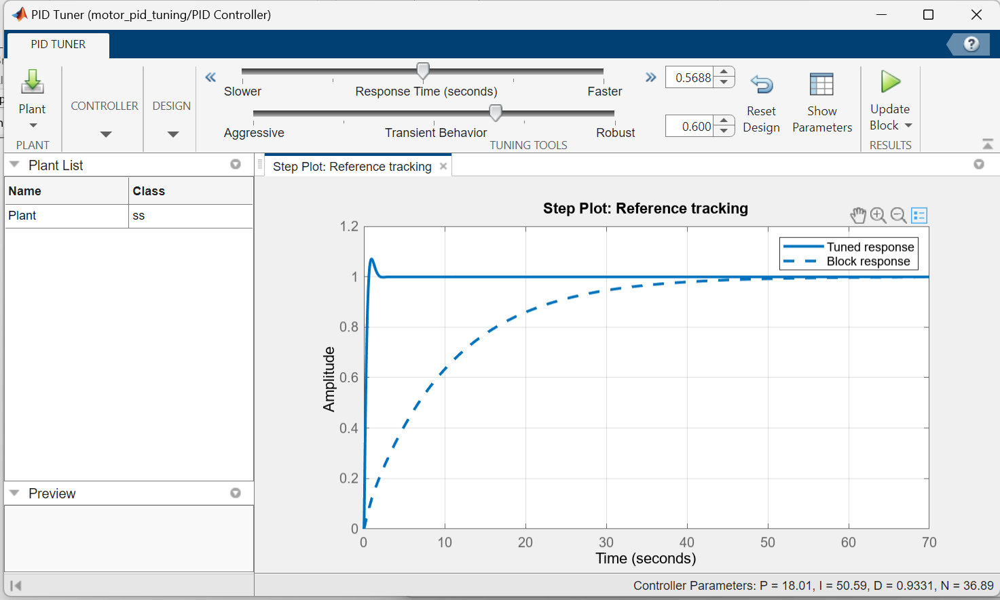
</div>
</center>

You can improve the response by adjusting the sliders at the top:
- **Response Time** - makes the closed-loop response of the control system faster or slower.
- **Transient Behaviour** - makes the controller more aggressive at disturbance rejection or more robust against plant uncertainty.

##### To see the Controller Effort:

- Go to **Design** > **Add Plot** > **Controller Effort**
- Right-click on the title of one of the Plots > **Tile All** > **Left/Right** to display the Plots side by side.

<center>
<div>
    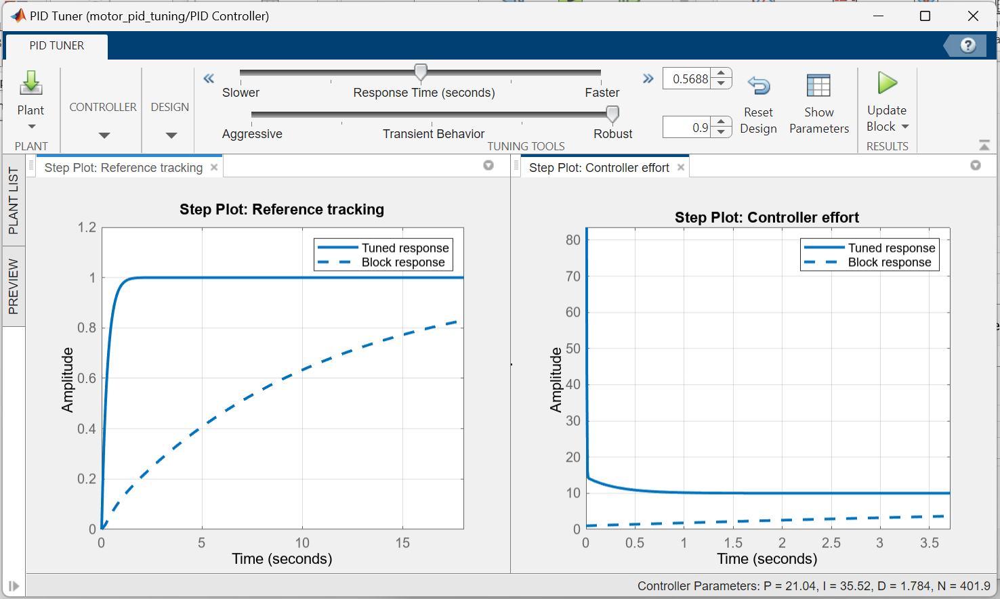
</div>
</center>

##### Finally:

- Click on **Update Block**
- Close the window.

This will give you the tuned PID gains as shown below:

<center>
<div>
    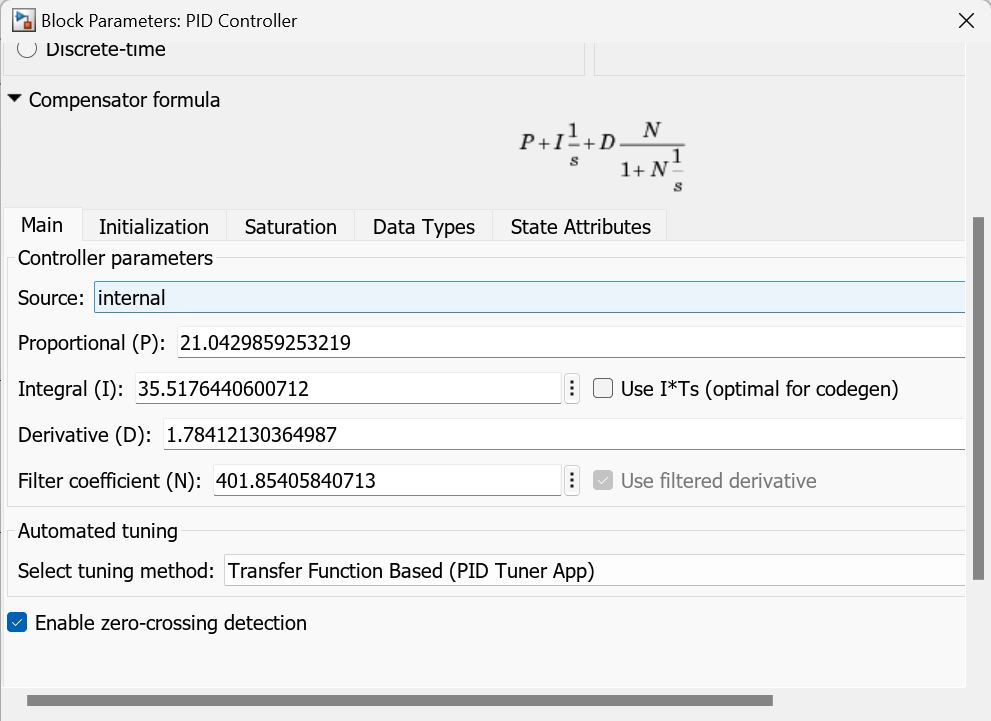
</div>
</center>

The final output of my PID controller (u) and the motor speed (y) is shown below:

<center>
<div>
    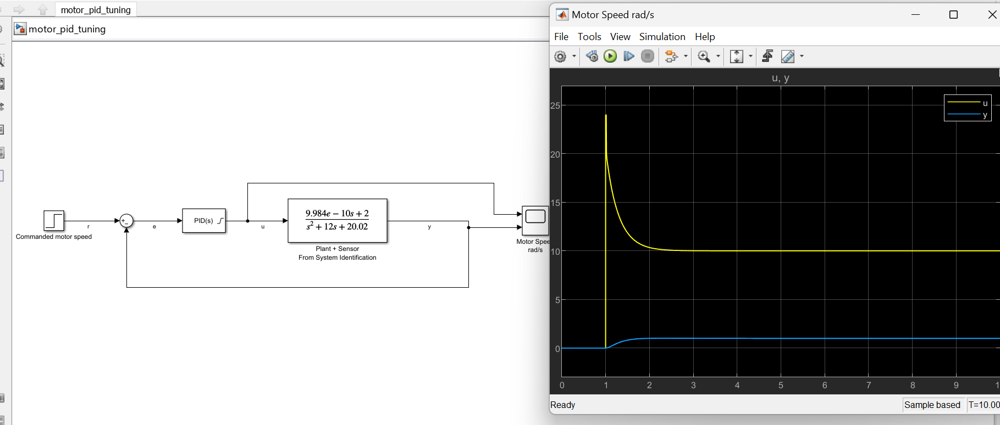
</div>
</center>

**Note: You can tweak the PID gains manually from the PID block parameters window to fine tune the system response.**

> ##### Further Learning
> You can watch this [video](https://www.youtube.com/watch?v=qj8vTO1eIHo&t=720s&ab_channel=MATLAB), that explains the steps covered above in detail.
> In Control Systems, we can cascade or nest PID control loops to improve the overall performance and also to make troubleshooting easier. You can watch this [video](https://www.youtube.com/watch?v=tbgV6caAVcs&ab_channel=MATLAB) that briefly explains the methods.

## Continuous Domain PID Implementation

In the previous steps, we have been working towards tuning a PID controller that receives a continuous signal and adjusts our input signal such that our model behaves as intended. However, our computers and microcontrollers are digital. They cannot give a continuous signal but rather a discrete signal.

There are various ways to solve this issue, we can use [discretization](https://en.wikipedia.org/wiki/Discretization) methods such as:

1. ZOH,
2. FOH,
3. Tustin (Bilinear Transform)

*A comprehensive list and descriptions of other methods can be found [here](https://www.mathworks.com/help/control/ug/continuous-discrete-conversion-methods.html?s_eid=PSM_15028)*

Before we can discretize our PID controller, let's implement the PID we derived earlier to our motor example and observe how the system behaves. Discretization will be covered in another tutorial.

**We will use some of the code we used to derive the `run sequence`**

### 1. Define our pins.

In [ ]:
// pins
#define EncOutA 2
#define EncOutB 4

#define MotorDirPin 5
#define MotorPWMPin 6

### 2. Define global variables

In [ ]:
// globals
long prevTime = 0;
int prevPos = 0;

// interrupt variables
volatile int interruptPos = 0;

const float PPR = 500;
const float MAX_PWM = 240;
float targetRPM = 200;

float e = 0;
float prevError = 0;
float eIntegral = 0;

- We can also add some **constants** for our PID gains we obtained from Matlab:

In [ ]:
const float Kp = 0.187732861046379;
const float Ki = 0.48084324989783;
const float Kd = -0.0466755616952318;

### 3. Setup function

In [ ]:
void setup()
{
    // put your setup code here, to run once:
    Serial.begin(115200);

    pinMode(EncOutA, INPUT_PULLUP);
    pinMode(EncOutB, INPUT_PULLUP);
    pinMode(MotorDirPin, INPUT);
    pinMode(MotorPWMPin, INPUT);

    digitalWrite(MotorDirPin, HIGH);

    // interrupt
    attachInterrupt(digitalPinToInterrupt(EncOutA), readEncoder, RISING);

    delay(2000);
}

### 4. define define our interrupt function

In [ ]:
void readEncoder()
{
    int b = digitalRead(EncOutB);

    if (b > 0)
    {
        interruptPos--;
    }
    else
    {
        interruptPos++;
    }
}

### 5. Loop function

- First, we calculate the **rpm** our motor is currently spinning at.

In [ ]:
int pos = 0;

    ATOMIC_BLOCK(ATOMIC_RESTORESTATE)
    {
        pos = interruptPos;
    }

    long currTime = micros();
    float deltaTime = ((float)(currTime - prevTime)) / 1.0e6;

    // calc velocity
    float v1 = (pos - prevPos) / deltaTime;
    prevPos = pos;
    prevTime = currTime;

    float motorRPM = v1 / PPR * 60.0; // multiply by 60 to convert to RPM


- To calculate the PID output we use the following equations:<br><br>
  <center>
      
  $error = target - actual$<br><br>
  $pid_p = K_p\times error$<br><br>
  $pid_i = K_i\times eIntegral$<br><br>
  $pid_d = K_d\times (error - prevError)$<br><br>
  $pid_{output} = pid_p + pid_i + pid_d$<br>
  </center>

  **Note:** `eIntegral` is the error accumulated over time.

  We can implement this in code as follows:

In [ ]:
 // PID
    e = targetRPM - motorRPM;

    float pid_p = Kp * e;
    float pid_i = Ki * eIntegral;
    float pid_d = Kd * (e - prevError);
    float u = pid_p + pid_i + pid_d;
    float output = constrain(u, 0, MAX_PWM);

- `constrain(u, 0, MAX_PWM);` this makes sure that our PWM output doesn't grow beyond our max value or go negative.
- Next, we set the PWM using the `analogWrite` function:

In [ ]:
    analogWrite(MotorPWMPin, output);

- After setting the output, we need to set the `prevError` to the error we just calculated and update the `eIntegral`

In [ ]:
  prevError = e;
    eIntegral = constrain(eIntegral + e, -4000, 4000);

**Note:** We constrain the `eIntegral` value such that when our actuator is inactive for a while, our `eIntegral` won't become too large that it will affect our system's response.

- We can output the current progress of our system using the Serial Plotter:

In [ ]:
// Target RPM
Serial.print("Target:");
Serial.println(targetRPM);

// Actual RPM
Serial.print("Motor:");
Serial.println(motorRPM);

**Note:** To use Serial Plotter to plot different functions or lines, you first print out the *Function Label* then the *value* separated by a colon => `Target:value`

- Lastly, we add a delay to give our system enough time to act.

In [ ]:
delay(10);

**A better way would to be to use timer interrupts to make sure that the PID is computed at equal time intervals.**